
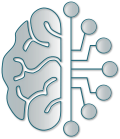

**Start at:** Thursday 23 November 2023, 11:44:28  
**Hostname:** insa-12842 (Linux)

<p style="text-align: center"><img width="800px" src="./config/svg/pyPhysChemBanner.svg" style="margin-left:auto; margin-right:auto"/></p>

In [1]:
import os
import sys

cwd0 = './config/'
sys.path.append(cwd0)

import visualID_Eng as vID
from visualID_Eng import color, fg, bg, hl
vID.init(cwd0)
import tools4pyPhysChem as t4pPC

#cancel the "last show-up" behaviour of Jupyter notebooks
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# 2D Convolutional Neural Networks (CNN)

## Introduction



<div class="intro">

The convolutional layer computes the convolutional operation of the input images using filters to extract features and scans the entire image looking through this filter

**Filters** are also sometimes called **windows**, or **kernels**. 
</div>

<div class="rq">

`imread` of matplotlib returns the image data as a `numpy.array`, which shape is

- (M, N) for grayscale images.

- (M, N, 3) for RGB images.

- (M, N, 4) for RGBA images.

PNG images are returned as float arrays (0-1). All other formats are returned as int arrays
</div>

### Useful functions

In [2]:
def plotimgs_SideBySide(img, imgW=8, titles=None, histogram=True):
    from matplotlib import pyplot as plt
    from skimage import exposure
    import numpy as np

    nPixH, nPixW = img[0].shape
    print(f"W: {nPixW} pixels x H: {nPixH} pixels = {nPixW*nPixH} pixels")

    def plotHisto(img, nplotsAxis0, nplotsAxis1, index):
        plt.subplot(nplotsAxis0, nplotsAxis1, index)
        plt.hist(img.ravel(), bins=256, histtype='step', color='black', label="histogram")
        plt.xlabel('Pixel intensity (0:Black ⇾ 1:White)')
        plt.xlim(0,1)
        plt.ylabel('Number of pixels')
        plt.legend()
        # Display cumulative distribution
        ax = plt.gca()
        ax_twinx = ax.twinx() 
        img_cdf, bins = exposure.cumulative_distribution(img, 256)
        ax_twinx.plot(bins, img_cdf, 'r', label="cumulative distribution")
        plt.legend()

    nimg=len(img)

    nplotsAxis1 = nimg
    if histogram:
        nplotsAxis0 = 2
    else:
        nplotsAxis0 = 1

    Wplot = nimg*imgW
    imgH = (nPixH/nPixW)*imgW
    heightHisto = 80*imgH/100
    # print(imgW,imgH)
    plt.figure(figsize=(Wplot, (imgH + heightHisto))) #
    colorTitle = 'black'
    for i in range(nimg):
        plt.subplot(nplotsAxis0, nplotsAxis1, i+1) # the third argument represents the index of the subplot that will be used
        plt.imshow(img[i], cmap="gray", interpolation="nearest") 
        plt.axis('off')
        plt.title(titles[i],color=colorTitle)
    
        if histogram:
            plotHisto(img[i], nplotsAxis0, nplotsAxis1, (nimg+i+1))
    plt.subplots_adjust(wspace=0.2, hspace=0.05)
    plt.show()

def kernel2D(N):
    import numpy as np
    K = np.ones((N,N),dtype=np.float64)/(N**2)
    return K


### Calculate the "derivatives" of an image

#### First derivative = convolution in 1D

$Ky=[-1,0,1]$

array([229, 230, 214], dtype=uint8)

0.8966035294117647

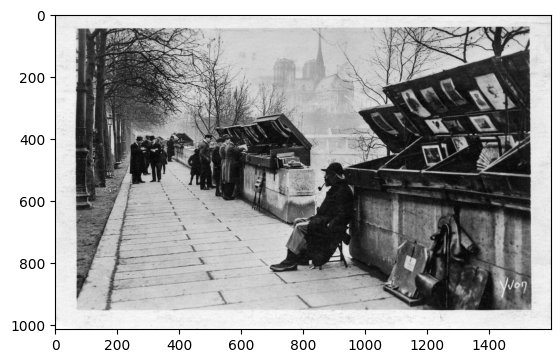

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.color import rgb2gray
from scipy.ndimage import convolve, convolve1d

img = plt.imread('./ML-Figures/bouquinistes/bouquinistes.jpg')
display(img[0,0]) #let's have a look at the first pixel
imgGray = rgb2gray(img)
display(imgGray[0,0])
plt.imshow(imgGray, cmap='gray',vmin=0.0, vmax=1.0)

W: 1600 pixels x H: 1014 pixels = 1622400 pixels


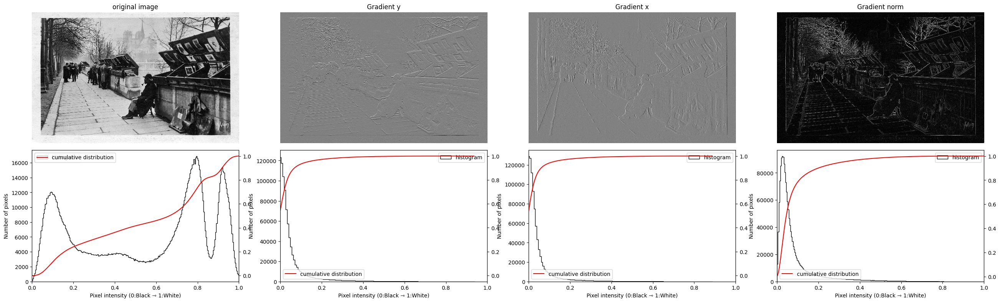

In [4]:
Ky= np.array([-1.,0.,1.])
imgRowAxis = convolve1d(imgGray,Ky,axis=0)
imgColAxis = convolve1d(imgGray,Ky,axis=1)
normGradient = np.sqrt(imgRowAxis**2+imgColAxis**2)

plotimgs_SideBySide([imgGray, imgRowAxis, imgColAxis, normGradient],imgW=8,titles=["original image","Gradient y","Gradient x", "Gradient norm"])

#### Second derivative = convolution in 2D

<div class="intro">

The Laplacian of an image, *i.e.* its "second derivative", highlights the areas of rapid changes in intensity and can thus be used for edge detection. It can be demonstrated that the Laplacian kernel can be formulated as:

$$\left(\begin{array}{ccc}
0 & 1 & 0\\
1 & -4 & 1\\
0 & 1 & 0
\end{array}\right)$$

It is a second order derivative mask. 
</div>

In [5]:
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
import numpy as np
from scipy.ndimage import convolve as cv
img = plt.imread('./ML-Figures/bouquinistes/bouquinistes.jpg')


<div class="rq">

Yet, the laplacian is very sensitive to noise. We will first start by blurring the image to remove noise.
</div>

In [6]:
Kblur = kernel2D(5)
Kblur
image_blurred = cv(imgGray,Kblur,mode='nearest')

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

<div class="intro">

The laplacian will now be applied to the blurred image. 
</div>

array([[ 0,  1,  0],
       [ 1, -4,  1],
       [ 0,  1,  0]])

W: 1600 pixels x H: 1014 pixels = 1622400 pixels


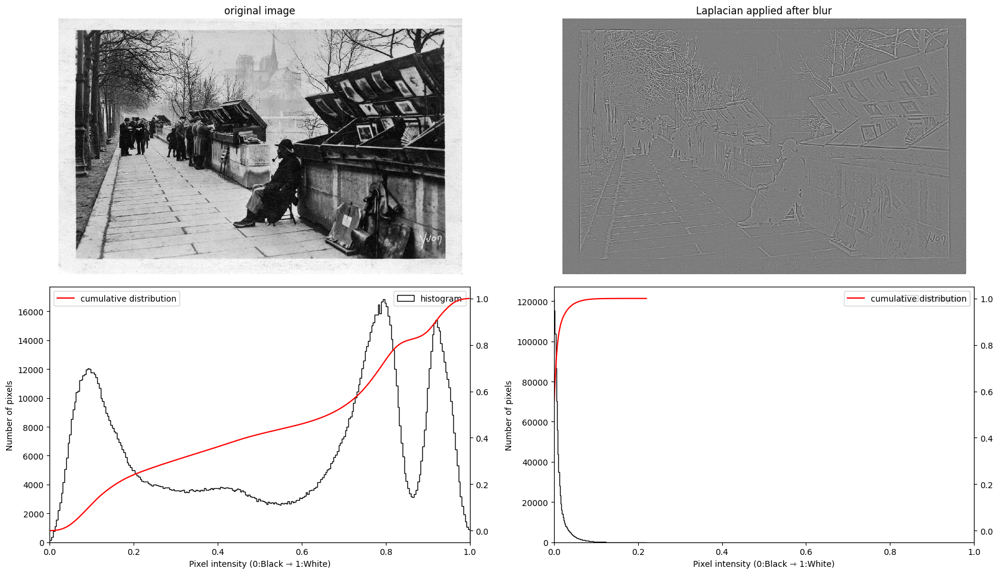

In [7]:
Kcv = np.array([0,1,0,1,-4,1,0,1,0])
Kcv = Kcv.reshape(3,3)
Kcv
image_cv = cv(image_blurred,Kcv,mode='nearest')
plotimgs_SideBySide([imgGray, image_cv],imgW=10,titles=["original image","Laplacian applied after blur"])

### Application: inpainting of an image

<div class="intro">

[Inpainting is a conservation process where damaged, deteriorated, or missing parts of an artwork are filled in to present a complete image](https://en.wikipedia.org/wiki/Inpainting)

From a conventional convolution of the signal *f* with kernel *K*, one would obtain a smoothed one where gaps of missing samples have been filled with the information available, that is: *f\*K*, where * is the convolution operator.

The idea of normalized convolution is that of associating to each signal a **certainty component** expressing the level of confidence in the reliability of each measure of a signal. The **certainty** associated with **missing samples** is equal to **zero**. Therefore we can express the certainty associated with signal *f* as a **map** *c* which has the **same dimension** as *f*. For a 2D image, it will be a 2D array filled with zeros (missing zones) and ones (information available).

The convolution of the certainty map *c* with the smoothing filter *K*, *i.e.* *c\*K* is a weight for the first convolution, which will express the confidence in the results of the conventional convolution.

An approximation of the original signal will be calculated as:

$$\tilde{f}=\frac{f*K}{c*K}$$
</div>

#### Simple example

#### Actual example

W: 1600 pixels x H: 1014 pixels = 1622400 pixels


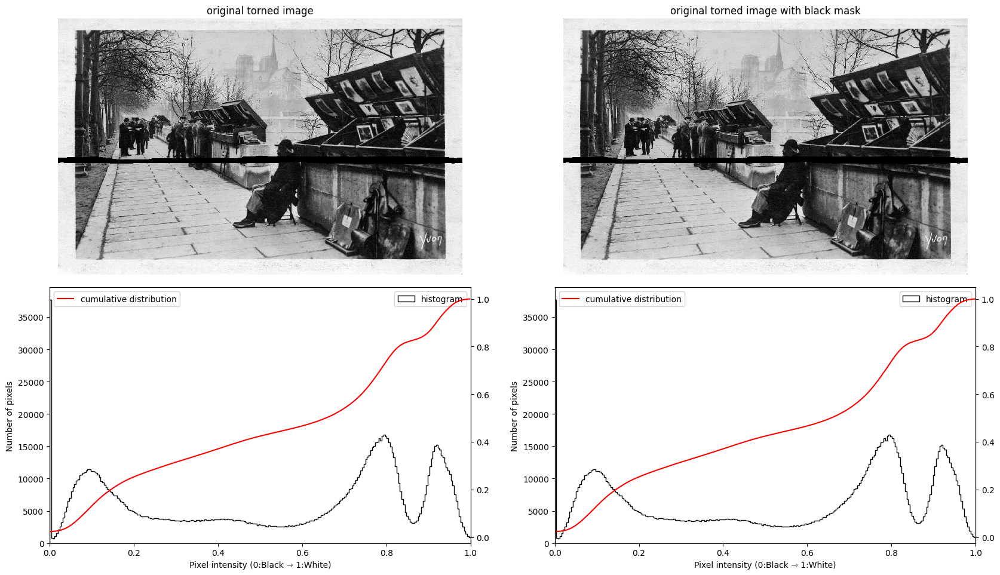

In [8]:
imgT = plt.imread('./ML-Figures/bouquinistes/bouquinistesTorned.jpg')
# imgT = plt.imread('./ML-Figures/bouquinistes/bouquinistesPepper.jpg')
imgTGray = rgb2gray(imgT)

imgTWM =  plt.imread('./ML-Figures/bouquinistes/bouquinistesTornedWithMask.jpg')
imgTWMGray = rgb2gray(imgTWM)
plotimgs_SideBySide([imgTGray, imgTWMGray],imgW=10,titles=["original torned image","original torned image with black mask"])

#### Normalization (rescaling the intensity)

0 247
W: 1600 pixels x H: 1014 pixels = 1622400 pixels


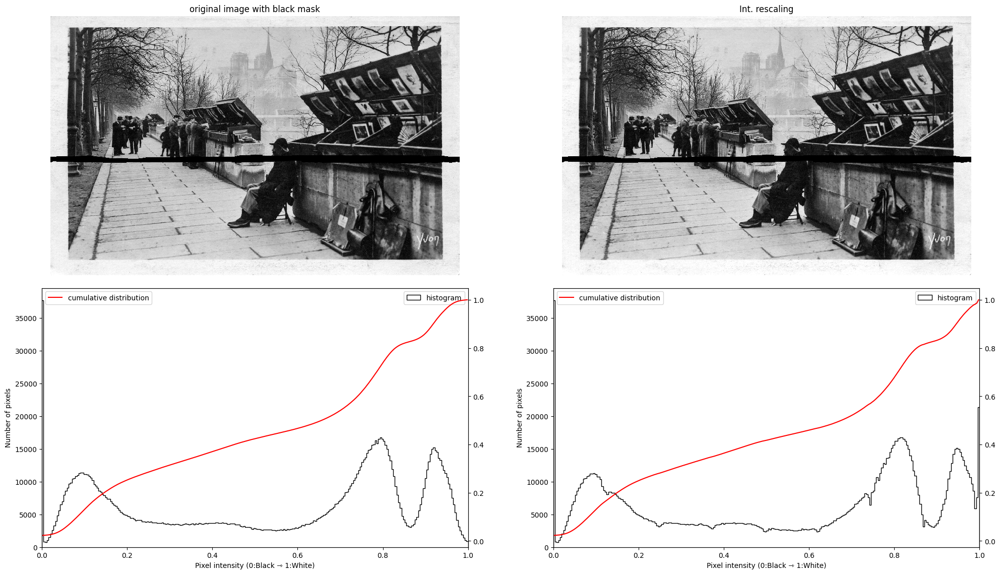

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from skimage.color import rgb2gray
from skimage.exposure import rescale_intensity

# Contrast stretching
p1, p99 = np.uint8(np.percentile(imgTWM, (1, 99)))
print(p1,p99)
imgTWMGray_ri = rgb2gray(rescale_intensity(imgTWM, in_range=(p1, p99)))

plotimgs_SideBySide([imgTWMGray, imgTWMGray_ri],imgW=12,titles=["original image with black mask","Int. rescaling"])

#### Extraction of the black mask

[[0.92377176 0.85093647 0.85430745 ... 0.85252706 0.84748235 0.84273451]
 [0.7918302  0.79433098 0.84871843 ... 0.87941333 0.86987373 0.86962   ]
 [0.82430392 0.84223725 0.84894235 ... 0.88539725 0.90304078 0.89297961]
 ...
 [1.         1.         1.         ... 0.62889961 0.73494627 0.98953843]
 [0.99802078 0.99773804 0.99802078 ... 0.76553804 0.85892235 0.9320149 ]
 [0.99858627 0.9968898  0.96720667 ... 0.92775176 0.94130314 0.95120863]]
W: 1600 pixels x H: 1014 pixels = 1622400 pixels


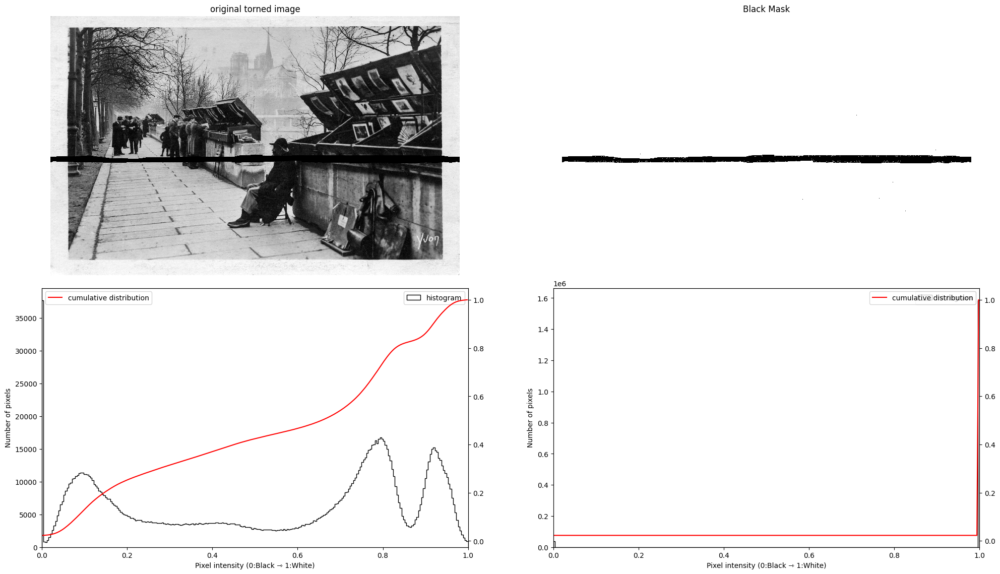

In [10]:
# Threshold to highlight the black mask [Int=0]
thresholdBlack = 0.001

# Binary mask. True if black
print(imgTWMGray_ri)
BoolBlackMask = imgTWMGray_ri < thresholdBlack
BlackMask = np.ones_like(imgTWMGray_ri)
BlackMask[BoolBlackMask] = 0.0

plotimgs_SideBySide([imgTGray, BlackMask],imgW=12,titles=["original torned image","Black Mask"])

#### Apply the normalized convolution in the vicinity of the missing region

<div class="intro">
</div>

<Figure size 1000x500 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Original Image')

(-0.5, 99.5, 99.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Mask')

(-0.5, 99.5, 99.5, -0.5)

<Axes: >

Text(0.5, 1.0, 'Inpainted Image')

(-0.5, 99.5, 99.5, -0.5)

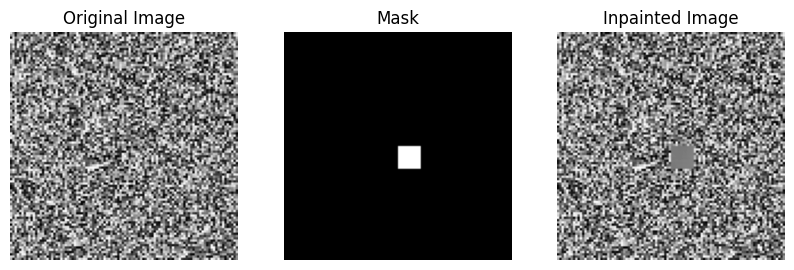

In [11]:
import numpy as np
from scipy.ndimage import convolve

def inpaint_normalized_convolution(image, mask, neighborhood_size=10):
    padded_image = np.pad(image, neighborhood_size, mode='constant')
    padded_mask = np.pad(mask, neighborhood_size, mode='constant')

    inpainted_image = np.copy(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if mask[i, j]:  # Check if pixel is missing
                neighborhood = padded_image[i:i+2*neighborhood_size+1, j:j+2*neighborhood_size+1]
                neighborhood_mask = padded_mask[i:i+2*neighborhood_size+1, j:j+2*neighborhood_size+1]

                # Compute weighted average (excluding missing pixels)
                weights = np.where(neighborhood_mask, 0, 1)
                inpainted_image[i, j] = np.sum(neighborhood * weights) / np.sum(weights)

    return inpainted_image

# Example usage
import matplotlib.pyplot as plt

# Create a sample image with a missing region
image = np.random.rand(100, 100)
mask = np.zeros_like(image)
mask[50:60, 50:60] = 1

# Inpaint the missing region
inpainted_image = inpaint_normalized_convolution(image, mask)

# Display the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray',vmin=0.0, vmax=1.0)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Mask')
plt.imshow(mask, cmap='gray',vmin=0.0, vmax=1.0)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Inpainted Image')
plt.imshow(inpainted_image, cmap='gray',vmin=0.0, vmax=1.0)
plt.axis('off')

plt.show()


The normalized convolution algorithm will be applied to a W:1600 pixels x H:1014 pixels image
(1014, 1600)


<Figure size 1200x600 with 0 Axes>

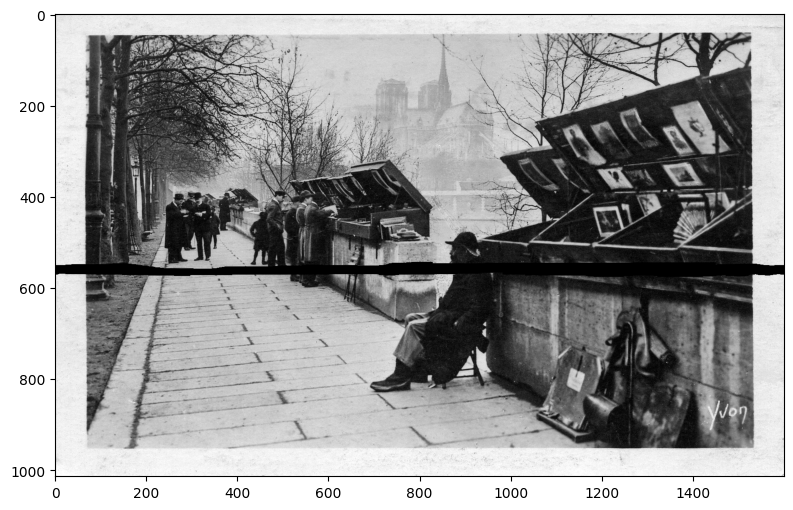

<Figure size 1200x600 with 0 Axes>

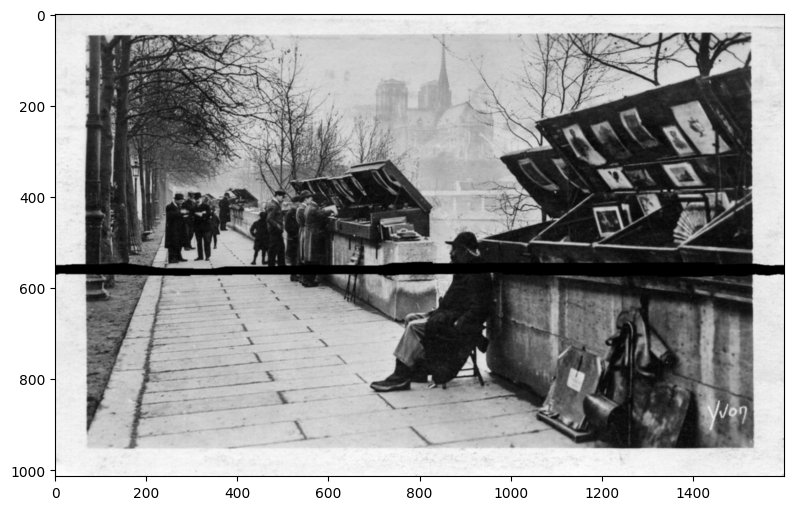

<Figure size 1200x600 with 0 Axes>

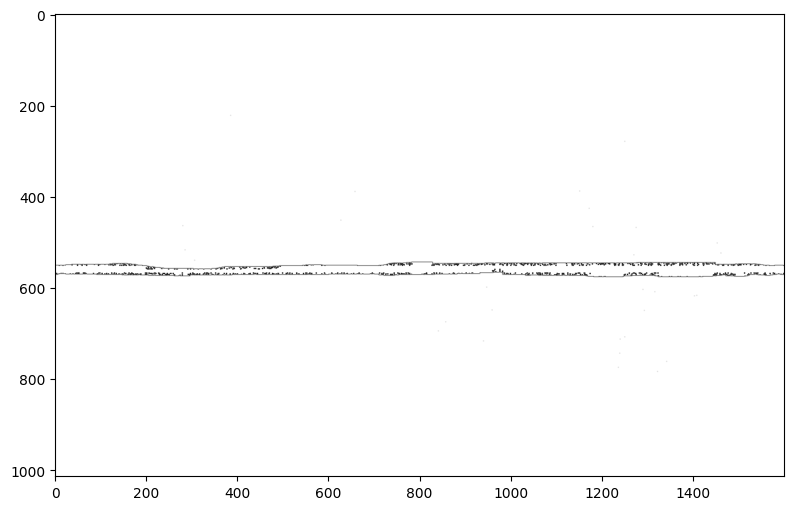

<Figure size 1200x600 with 0 Axes>

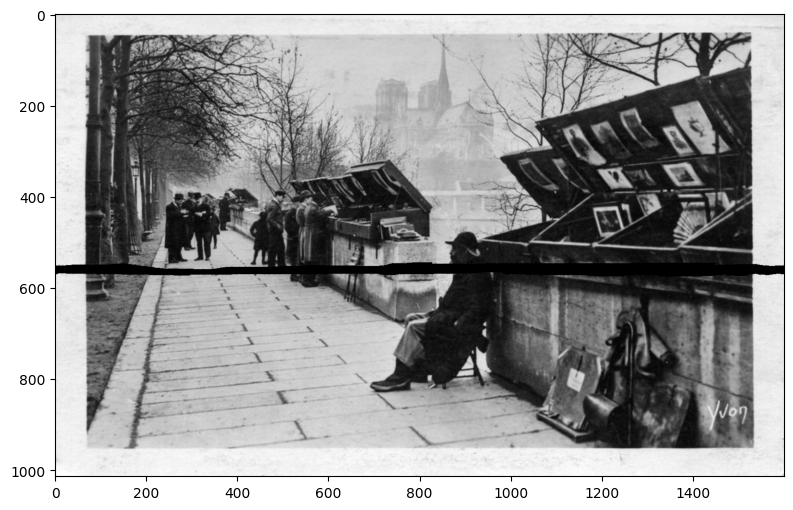

In [12]:
from scipy.ndimage import convolve as cv
kernelsize = 3
K = kernel2D(kernelsize)

H, W = imgTWMGray.shape
print(f"The normalized convolution algorithm will be applied to a W:{W} pixels x H:{H} pixels image")
np.set_printoptions(linewidth=2000)

inpainted_img = imgTWMGray.copy()
# inpainted_img = np.ones_like(imgTGray)
print(inpainted_img.shape)
plt.figure(figsize=(12,6))
plt.imshow(inpainted_img, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()

num = cv(imgTWMGray,K,mode='reflect')
den = cv(BlackMask,K,mode='reflect')
den[den == 0] = 1  # Avoid division by zero

plt.figure(figsize=(12,6))
plt.imshow(num, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()
plt.figure(figsize=(12,6))
plt.imshow(den, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()
ftilde = num/den
plt.figure(figsize=(12,6))
plt.imshow(ftilde, cmap='gray')
plt.show()

The normalized convolution algorithm will be applied to a W:1600 pixels x H:1014 pixels image
(1014, 1600)


<Figure size 1200x600 with 0 Axes>

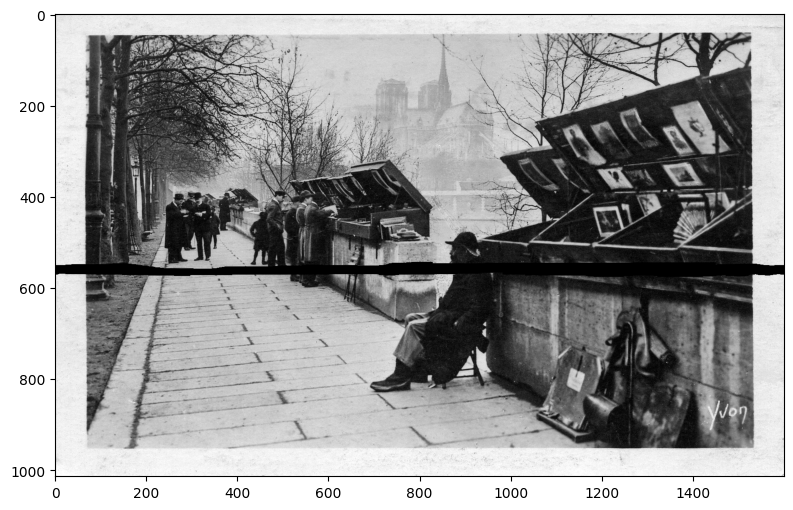

Size of the padded image is:1626 pixels x H:1040 pixels image


<Figure size 1200x600 with 0 Axes>

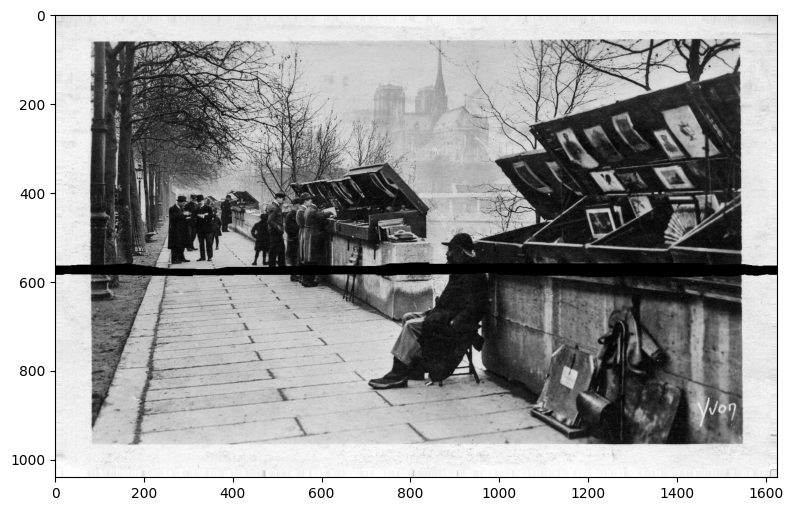

KeyboardInterrupt: 

In [13]:
from scipy.ndimage import convolve as cv

window = 25 #must be an odd value
midw = window//2
padimg = midw+1 #the image will be enlarged by padimg pixels in all directions
# the (h,w) coordinates of the img will be (h+padimg,w+padimg) in its padded counterpart

kernelsize = 25
K = kernel2D(kernelsize)

H, W = imgTWMGray.shape
print(f"The normalized convolution algorithm will be applied to a W:{W} pixels x H:{H} pixels image")
np.set_printoptions(linewidth=2000)

inpainted_img = imgTWMGray.copy()
# inpainted_img = np.ones_like(imgTGray)
print(inpainted_img.shape)
plt.figure(figsize=(12,6))
plt.imshow(inpainted_img, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()
imgTGray_padded = np.pad(imgTWMGray.copy(),(padimg,padimg),'edge')
BlackMask_padded = np.pad(BlackMask.copy(),(padimg,padimg),'edge')
HP, WP = imgTGray_padded.shape
print(f"Size of the padded image is:{WP} pixels x H:{HP} pixels image")
plt.figure(figsize=(12,6))
plt.imshow(imgTGray_padded, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()

i = 0
ftildeT = []
for h in range(H):
    for w in range(W):
        if BoolBlackMask[h,w]:
            hpad = h+padimg
            wpad = w+padimg
            selection = imgTGray_padded[hpad-midw:hpad+midw+1,wpad-midw:wpad+midw+1]
            selectionMask = BlackMask_padded[hpad-midw:hpad+midw+1,wpad-midw:wpad+midw+1]
            # print(h,h+padimg-midw,h+padimg+midw+1,w,w+padimg-midw,w+padimg+midw+1)
            # print(selection.shape)
            num = cv(selection,K,mode='reflect')
            den = cv(selectionMask,K,mode='reflect')
            ftilde = num[midw,midw]/den[midw,midw]
            if np.isnan(ftilde):
                ftilde = 0.0
            if np.isinf(ftilde):
                ftilde = imgTGray[h,w]
            # ftilde = num[midw,midw]
            if (ftilde > 1.0 and i < 6):
                i+=1
                print('-----------------------------------------',h,w)
                print(BlackMask[h,w] == BlackMask_padded[h+padimg,w+padimg])
                print(imgTGray[h,w] == imgTGray_padded[h+padimg,w+padimg])
                print(BoolBlackMask[h,w], imgTWMGray[h,w], imgTGray[h,w])
                print(h,h+padimg-midw-1,h+padimg+midw)
                print(w,w+padimg-midw-1,w+padimg+midw)
                print("selection")
                print(selection)
                print("mask")
                print(selectionMask)
                print("num")
                print(num)
                print("den")
                print(den)
                print("num/den")
                print(num/den)
            ftildeT.append(ftilde)
            # print("======================",h,w,ftilde)
            # inpainted_img[h,w] = ftilde
            inpainted_img[h,w] = ftilde
plt.figure(figsize=(12,6))
plt.imshow(inpainted_img, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()
# print(ftildeT)

In [ ]:
np.set_printoptions(linewidth=1000)
f = np.array([1.0,0.0,0.0,4.0,5.0,0.0,7.0,0.0])
g = np.array([1/3,1/3,1/3])
c = np.array([1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0])
fg = np.convolve(f,g,mode='same')
print(fg)
cg = np.convolve(c,g,mode='same')
print(cg)
print(fg/cg)
print()
from scipy.ndimage import convolve1d
fg = convolve1d(f,g)
print(fg)
cg = convolve1d(c,g)
print(cg)
print(fg/cg)
print()
print()
np.set_printoptions(linewidth=1000)
f = np.array([0.1,0.0,0.0,0.4,0.5,0.0,0.7,0.0])
g = np.array([1/3,1/3,1/3])
c = np.array([1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0])
fg = np.convolve(f,g,mode='same')
print(fg)
cg = np.convolve(c,g,mode='same')
print(cg)
print(fg/cg)
print()
from scipy.ndimage import convolve1d
fg = convolve1d(f,g)
print(fg)
cg = convolve1d(c,g)
print(cg)
print(fg/cg)


## Building an image classifier using the Keras sequential API

In [14]:
import sklearn
import tensorflow as tf

import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

2023-11-23 11:46:04.645819: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-23 11:46:04.670528: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-23 11:46:04.789516: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-11-23 11:46:04.790787: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-23 11:46:05.926361: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not fin

### Useful functions

<div class="intro">
    
Let's create an `ML-SavedFigures` folder (if it doesn't already exist), and define the `save_fig()` function which is used through this notebook to save the figures in high-res
</div>

In [15]:
from pathlib import Path

IMAGES_PATH = Path() / "ML-SavedFigures"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

def save_fig(fig_id, IMAGES_PATH=".", tight_layout=True, fig_extension="png", resolution=300):
    '''
    saves a figure to a given subfolder, that will be created if it does not exist
    input:
        - fig_id = name of the figure, without an extension
        - IMAGES_PATH = pathway to the folder. Default: "."
        - tight_layout = boolean. Automatically adjusts subplot params so that the subplot(s) fits in to the figure area. Default: True
        - fig_extension = image type. Default: png
        - resolution = resolution of the figure, in dpi. Default: 300
    '''
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

def plotFashionToGrid(X, y, fashion_names, nrows=5, ncols=8, startFrom=0, yActual=None, saveFig = False, IMAGES_PATH="."):
    '''
    plots nrows x ncols images with plt.imshow(), with their label as title
    input:
        - X = array with nimg b&w images coded as (npix,npix). Size = (nimg, npix, npix)  
        - y = 1D array made of nimg integers = class number
        - fashion_names = array with the corresponding class names
        - nrows, ncols = dimension of the plot grid (nrows x ncols must be <= nimg)
        - startFrom = index of the first image that will be shown
        - yActual = only useful when evaluating a prediction. It will contain the
          actual integer labels of the images
          In this case, y must be set to the value predicted by the model
          When a prediction is wrong, the label will be shown in red
        - saveFig = saves the figure to IMAGES_PATH
        - IMAGES_PATH = pathway to save images. Default: "."
    '''
    from matplotlib import pyplot as plt
    plt.rc('font', size=14)
    plt.rc('axes', labelsize=14, titlesize=12)
    plt.rc('legend', fontsize=14)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.figure(figsize=(ncols * 1.2, nrows * 1.2))
    nimg = nrows * ncols
    if nimg > len(y) - startFrom:
        print(f"Sample size = {len(y)}. Cannot plot {nrows} x {ncols} = {nimg} images, with startFrom set as {startFrom}")
        print(f"startFrom automatically setup to {len(y) - nimg}")
        startFrom = len(y) - nimg
    for row in range(nrows):
        for col in range(ncols):
            index = ncols * row + col + startFrom
            plt.subplot(nrows, ncols, index + 1 - startFrom) # the third argument represents the index of the subplot that will be used
            plt.imshow(X[index], cmap="binary", interpolation="nearest",vmin=0.0, vmax=1.0) # the data X is resampled to the pixel size of the image on the figure canvas, using the "nearest" interpolation method
            plt.axis('off')
            colorTitle = 'black'
            if yActual is not None and yActual[index] != y[index]:
                colorTitle='red'
            plt.title(fashion_names[y[index]],color=colorTitle)
    plt.subplots_adjust(wspace=0.2, hspace=0.5)
    if (saveFig):
        save_fig(IMAGES_PATH,"fashion_mnist_grid")
    plt.show()

def plot_metrics(historyDf, saveFig=False, IMAGES_PATH="."):
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    
    nepochs = historyDf.shape[0]
    maxl = np.max(historyDf["loss"])
    maxvl = np.max(historyDf["val_loss"])
    maxac = np.max(historyDf["accuracy"])
    maxvac = np.max(historyDf["val_accuracy"])
    max = np.max([maxl,maxvl,maxac,maxvac])+0.1
    historyDf.plot(
        figsize=(8, 5), xlim=[0, nepochs], ylim=[0, max], grid=False, xlabel="Epoch",
        style=["C0--v", "C0--p", "C1-v", "C1-p"])
    plt.axhline(y=1, color="black", linestyle="--", lw=1)
    plt.legend()
    if (saveFig):
        save_fig(IMAGES_PATH, "fashion_mnist_plot_epochs")  # extra code
    plt.show()
    return

def plotConfusionMatrix(y_trainC, y_trainC_hat, y_valC, y_valC_hat, y_testC, y_testC_hat, uv, saveFig=False, IMAGES_PATH="."):
    from sklearn.metrics import ConfusionMatrixDisplay
    from sklearn.metrics import confusion_matrix
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    import seaborn as sns
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import mean_absolute_error
    from sklearn.metrics import mean_squared_error
    import numpy as np
    
    cm_labels = uv
    # this will give large numbers. Not very convenient
    cm_trs = confusion_matrix(y_trainC, np.argmax(y_trainC_hat,axis=1))
    cm_vls = confusion_matrix(y_valC, np.argmax(y_valC_hat,axis=1))
    cm_tts = confusion_matrix(y_testC, np.argmax(y_testC_hat,axis=1))

    # print(cm_trs)
    # print(cm_trs.sum(axis=1))
    # print(cm_trs.sum(axis=1).reshape(len(cm_labels),1))

    # transform into percentage
    cm_trs = 100.0*cm_trs.astype("float")/cm_trs.sum(axis=1).reshape(len(cm_labels),1)
    cm_vls = 100.0*cm_vls.astype("float")/cm_vls.sum(axis=1).reshape(len(cm_labels),1)
    cm_tts = 100.0*cm_tts.astype("float")/cm_tts.sum(axis=1).reshape(len(cm_labels),1)

    fig=plt.figure(figsize=(21,6))
    plt.rc('font', size=10)
    plt.rc('axes', labelsize=14, titlesize=12)
    plt.rc('legend', fontsize=14)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    gs = gridspec.GridSpec(nrows=1, ncols=3, width_ratios=[1, 1, 1])
    
    ax00 = fig.add_subplot(gs[0, 0], title="Training set. Confusion Matrix")
    sns.heatmap(pd.DataFrame(cm_trs, columns=cm_labels, index=cm_labels), ax=ax00, cmap=plt.cm.Blues, annot = True, fmt='.1f')
    ax00.set_xlabel("predicted", fontsize = 14)
    ax00.set_ylabel("real", fontsize = 14)
    
    ax01 = fig.add_subplot(gs[0, 1], title="Validation set. Confusion Matrix")
    sns.heatmap(pd.DataFrame(cm_vls, columns=cm_labels, index=cm_labels), ax=ax01, cmap=plt.cm.Blues, annot = True, fmt='.1f')
    ax01.set_xlabel("predicted", fontsize = 14)
    ax01.set_ylabel("real", fontsize = 14)
    
    ax02=fig.add_subplot(gs[0, 2], title="Test set. Confusion Matrix")
    sns.heatmap(pd.DataFrame(cm_tts, columns=cm_labels, index=cm_labels), ax=ax02, cmap=plt.cm.Blues, annot = True, fmt='.1f')
    ax02.set_xlabel("predicted", fontsize = 14)
    ax02.set_ylabel("real", fontsize = 14)
    plt.show()

    atrs = accuracy_score(y_trainC,np.argmax(y_trainC_hat,axis=1))
    avls = accuracy_score(y_valC,np.argmax(y_valC_hat,axis=1))
    atts = accuracy_score(y_testC,np.argmax(y_testC_hat,axis=1))
    maetrs = mean_absolute_error(y_trainC,np.argmax(y_trainC_hat,axis=1))
    maevls = mean_absolute_error(y_valC,np.argmax(y_valC_hat,axis=1))
    maetts = mean_absolute_error(y_testC,np.argmax(y_testC_hat,axis=1))
    msetrs = mean_squared_error(y_trainC,np.argmax(y_trainC_hat,axis=1))
    msevls = mean_squared_error(y_valC,np.argmax(y_valC_hat,axis=1))
    msetts = mean_squared_error(y_testC,np.argmax(y_testC_hat,axis=1))
    print(f"{hl.BOLD}{fg.BLUE}                     Accuracy      MAE         MSE")
    print(f"{hl.BOLD}{fg.PURPLE}   Training set.      {atrs:.2f}        {maetrs:.2f}        {msetrs:.2f}")
    print(f"{hl.BOLD}{fg.DARKGRAY} Validation set.      {avls:.2f}        {maevls:.2f}        {msevls:.2f}")
    print(f"{hl.BOLD}{fg.GREEN}       Test set.      {atts:.2f}        {maetts:.2f}        {msetts:.2f}")

    if saveFig:
        save_fig(IMAGES_PATH,"fashion_mnist_confusionMatrices")
    return

def SobelBW(imgDataSet,mode='reflect'):
    '''
    Apply the Sobel filter to a grayscale image, using the 'reflect' mode of convolve by default
    input:
        imgDataSet = grayscale dataset of images
        mode = determines how the input array is extended beyond its boundaries
               {‘reflect’, ‘constant’, ‘nearest’, ‘mirror’, ‘wrap’} (see scipy.ndimage.convolve)
    output:
        image convolved by the Sobel kernel
    '''
    import numpy as np
    from scipy.ndimage import convolve
    Sobel = np.array([-1, -2, -1,0,0,0,1,2,1])
    Sobel=Sobel.reshape(3,3)
    imgS = []
    for img in imgDataSet:
         imgS.append(convolve(img,Sobel,mode=mode))
    imgS=np.array(imgS)
    return imgS

def reshapeForConv2D(X):
    '''
    the conv2D layer of keras read a 4D tensor with shape: `(batch_size, image_size1, image_size2, channels)`
    this function reshapes an (k,m,n) tensor into a (k,m,n,1) tensor
    '''
    print(f"Shape before = {X.shape}")
    Xreshaped = X.reshape(X.shape[0],X.shape[1],X.shape[2],1)
    Xreshaped.shape
    print(f" Shape after = {Xreshaped.shape}")
    return Xreshaped

### MNIST data

#### Read the fashion MNIST dataset

<div class="intro">

Let's start by loading the [fashion MNIST dataset](https://github.com/zalandoresearch/fashion-mnist). Keras has a number of functions to load popular datasets in `tf.keras.datasets`. The dataset is **already split** between a training set (60,000 images) and a test set (10,000 images), but it can be useful to split the training set further to have a validation set. We'll use 55,000 images for training, and 5,000 for validation.

</div>

In [16]:
fashion_mnist = tf.keras.datasets.fashion_mnist.load_data()
len(fashion_mnist)
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist

2

<div class="intro">

The training and test sets contain 60000 and 10000 grayscale images, each 28x28 pixels.

Each pixel intensity of the input (`X`) sets is represented as a byte (0 to 255). The labels (`y`) are the class IDs (represented as `uint8`), from 0 to 9. Each training and test example is indeed assigned to one of the following labels:

|label|description|
|:-----|:------------|
|0|	T-shirt/top|
|1|	Trouser|
|2|	Pullover|
|3|	Dress|
|4|	Coat|
|5|	Sandal|
|6|	Shirt|
|7|	Sneaker|
|8|	Bag|
|9|	Ankle boot|

</div>

(60000, 28, 28)

(60000,)

(10000, 28, 28)

(10000,)

dtype('uint8')

dtype('uint8')

array([[  0,   0,   0,   0,   0,   0,   0,   0,   6, 123,  88, 103,  54,  26,  95,  84,  91,  92, 122,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  85, 228, 210, 212, 199, 179, 253, 209, 213, 208, 220,  56,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 100, 214, 194, 198, 204, 207, 200, 197, 196, 193, 207,  85,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 114, 212, 199, 200, 197, 194, 192, 198, 197, 196, 207,  98,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 131, 228, 194, 199, 198, 197, 192, 197, 197, 194, 233, 100,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 149, 222, 192, 197, 196, 198, 193, 196, 196, 190, 223, 125,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 158, 216, 192, 195, 195, 196, 192, 198, 196, 189, 213, 143

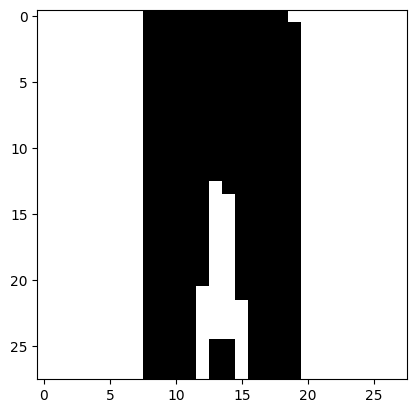

1

In [17]:
t4pPC.centerTitle("Shapes")
X_train_full.shape
y_train_full.shape
X_test.shape
y_test.shape

t4pPC.centerTitle("Types")
X_train_full.dtype
y_train_full.dtype

t4pPC.centerTitle("1st image")
display(X_train_full[2325])
plt.imshow(X_train_full[2325], cmap="binary",vmin=0.0, vmax=1.0); plt.show()
display(y_train_full[2325])

<div class="rqT" title="Integer numbers in computer science">

In computer science, an integer is a data type that represents some range of mathematical integers. Common integer types are reported below, with their range

|bits|name|range|
|----:|------:|:------|
|4|`int4`|[-8,7]|
|4|`uint4`|[0,15]|
|8|`int8`|[-128,127]|
|8|`uint8`|[0,255]|
|16|`int16`|[-32768,32767]|
|16|`uint16`|[0,65535]|
|32|`int32`|[-2 147 483 648,2 147 483 647]|
|32|`uint32`|[0,4 294 967 295]|

- signed integral type with *n* bits represent numbers in the range [−2<sup>*n*−1</sup>, 2<sup>*n*−1</sup>−1]
- unsigned integral type with *n* bits represent numbers in the range [0, 2<sup>*n*</sup>−1]
</div>

<div class="intro">

Let's now define the 10 class names in a `fashion_names` list
</div>

In [18]:
fashion_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat",
               "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]
nclass = len(fashion_names)

#### Standardization of the data

<div class="intro">

For simplicity, let's scale the pixel intensities down to the 0-1 range and convert them to floats, by dividing by 255.0

</div>

In [19]:
X_train_full = X_train_full/255.0
X_test = X_test/255.0

#### Plot a sample of the images

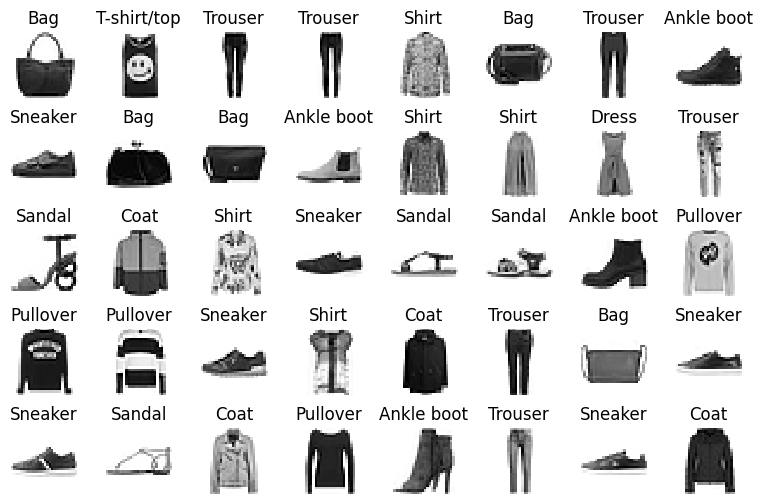

In [20]:
plotFashionToGrid(X_train_full, y_train_full, fashion_names, nrows=5, ncols=8, startFrom=100)

#### Make the training, validation and test sets

In [21]:
X_train, y_train = X_train_full[:-5000], y_train_full[:-5000]
X_valid, y_valid = X_train_full[-5000:], y_train_full[-5000:]
t4pPC.centerTitle("Training set")
X_train.shape
y_train.shape
t4pPC.centerTitle("Validation set")
X_valid.shape
y_valid.shape
t4pPC.centerTitle("Test set")
X_test.shape
y_test.shape

(55000, 28, 28)

(55000,)

(5000, 28, 28)

(5000,)

(10000, 28, 28)

(10000,)

### Supervised learning of the fashion MNIST database, with a simple DNN

#### Creation and compilation of the model

<div class="rq">

Keras manages a global state, which it uses to implement the Functional model-building API and to uniquify autogenerated layer names.

If you are creating many models in a loop, this global state will consume an increasing amount of memory over time, and you may want to clear it. [Calling `clear_session()`](https://www.tensorflow.org/api_docs/python/tf/keras/backend/clear_session) releases the global state: this helps avoid clutter from old models and layers, especially when memory is limited.

</div>

2023-11-23 11:46:28.731175: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 100)               78500     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 20)                2020      
                                                                 
 dense_2 (Dense)             (None, 10)                210       
                                                                 
Total params: 80730 (315.35 KB)
Trainable params: 80730 (315.35 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


array([[-0.00067683, -0.0430586 , -0.06340434, ...,  0.00585781,  0.07038349,  0.0557887 ],
       [ 0.06980994, -0.07839717,  0.02790389, ...,  0.03592128, -0.07851783,  0.03165046],
       [-0.01829861,  0.07280178,  0.03543297, ..., -0.05262176, -0.04269015, -0.00609275],
       ...,
       [-0.0028786 ,  0.01213158, -0.06050444, ..., -0.004781  , -0.0187875 , -0.07150979],
       [-0.07750995,  0.07179449, -0.01885472, ...,  0.07768676, -0.04509272, -0.05676043],
       [-0.06706263,  0.02139019,  0.04185272, ...,  0.07716992, -0.04633955, -0.02244472]], dtype=float32)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)

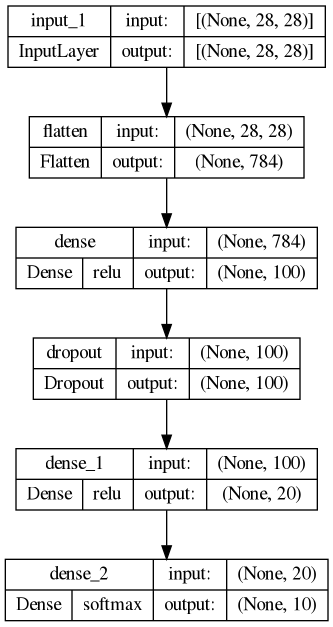

In [22]:
tf.keras.backend.clear_session()

model = tf.keras.Sequential()
model.add(tf.keras.layers.InputLayer(input_shape=[28, 28]))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(100, activation="relu"))
model.add(tf.keras.layers.Dropout(0.3))
model.add(tf.keras.layers.Dense(20, activation="relu"))
model.add(tf.keras.layers.Dense(nclass, activation="softmax"))

t4pPC.centerTitle("Summary of the model")
model.summary()

t4pPC.centerTitle("Layers")
model.layers
hidden1 = model.layers[1]
weights, biases = hidden1.get_weights()
weights
biases

t4pPC.centerTitle("Plot model")
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, show_layer_activations=True)

<div class="rqT" title = "Sparse categorical crossentropy">

Categorical_crossentropy (`cce`) produces a one-hot array containing the probable match for each category

Sparse_categorical_crossentropy (`scce`) produces a category index of the most likely matching category. It is also named *Softmax Loss*. It is a *Softmax* activation plus a *Cross-Entropy* loss

**Consider a classification problem with 5 categories (or classes)**

- in the case of `cce`, the one-hot target may be `[0, 1, 0, 0, 0]` and the model may predict `[.2, .5, .1, .1, .1]`, which is probably right given that the 0.5 probablity is significantly higher than the other numbers
- in the case of `scce`, the target index may be `[1]` and the model may predict: `[.5]`

**Consider now a classification problem with 3 classes**

- in the case of `cce`, the one-hot target might be `[0, 0, 1]` and the model may predict `[.5, .1, .4]`, which is probably inaccurate, given that it gives more probability to the first class
- in the case of `scce`, the target index might be `[0]`, and the model may predict `[.5]`

Many categorical models produce `scce` output because you save space, but **lose a lot of information** (for example, in the 2nd example, index 2 was also very close.)

**There are a number of situations to use `scce`, including**

- when your classes are mutually exclusive, i.e. you don’t care at all about other close-enough predictions,
- the number of categories is large to the prediction output becomes overwhelming
</div>
<br>
<div class="rqT" title="Stochastic Gradient Descent (SGD)">
</div>

In [23]:
from tensorflow.keras.optimizers import SGD
optimizer = SGD(learning_rate=0.1)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

#### Training

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
rlr = ReduceLROnPlateau(monitor='val_loss',factor=0.5,patience=2,min_lr=1.e-6,verbose=1,min_delta=0.2)

vID.chrono_start()
history = model.fit(X_train, y_train,
                    epochs = 30,
                    validation_data=(X_valid, y_valid),
                    verbose = 1,
                    callbacks=[es,rlr],
                   )
vID.chrono_show()

In [25]:
t4pPC.centerTitle("history.params")
history.params
t4pPC.centerTitle("history.history")
import pandas as pd
historyDf = pd.DataFrame(history.history)
display(historyDf)

{'verbose': 1, 'epochs': 30, 'steps': 1719}

,loss,accuracy,val_loss,val_accuracy,lr
0,0.641932,0.764745,0.453779,0.8248,0.100000
1,0.473497,0.828000,0.436702,0.8402,0.100000
2,0.434662,0.842327,0.376927,0.8634,0.100000
3,0.380294,0.861291,0.355839,0.8694,0.050000
4,0.371261,0.864745,0.348365,0.8706,0.050000
5,0.349294,0.870455,0.340918,0.8704,0.025000
6,0.342317,0.874473,0.337839,0.8712,0.025000
7,0.329835,0.879909,0.333939,0.8764,0.012500
8,0.326939,0.880218,0.330101,0.8786,0.012500
9,0.320892,0.882145,0.325849,0.8800,0.006250


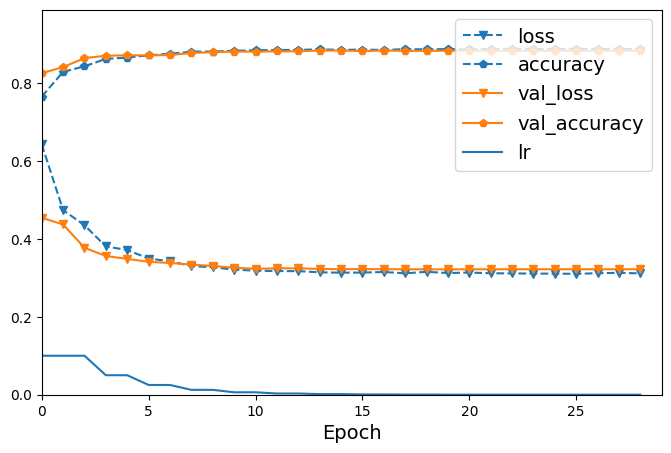

In [26]:
plot_metrics(historyDf)

#### Evaluation of the accuracy

In [27]:
t4pPC.centerTitle("training set")
model.evaluate(X_train, y_train)
t4pPC.centerTitle("validation set")
model.evaluate(X_valid, y_valid)
t4pPC.centerTitle("test set")
model.evaluate(X_test, y_test)

1719/1719 [==============================] - 3s 1ms/step - loss: 0.2753 - accuracy: 0.8982


[0.2753245532512665, 0.8981999754905701]

157/157 [==============================] - 0s 2ms/step - loss: 0.3218 - accuracy: 0.8820


[0.321841835975647, 0.8820000290870667]

313/313 [==============================] - 1s 2ms/step - loss: 0.3509 - accuracy: 0.8725


[0.3508903682231903, 0.8725000023841858]

#### Prediction and comparison with the actual class

##### Selection of images of the test set

In [28]:
startFrom = 0
ncols = 8
nrows = 5
X_new = X_test[startFrom:ncols*nrows]
y_new = y_test[startFrom:ncols*nrows]
y_hat = model.predict(X_new)
y_hat.round(2)
y_pred = y_hat.argmax(axis=1)
y_pred

2/2 [==============================] - 0s 2ms/step


array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.01, 0.  , 0.04, 0.  , 0.95],
       [0.  , 0.  , 0.99, 0.  , 0.  , 0.  , 0.01, 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.1 , 0.  , 0.05, 0.  , 0.01, 0.  , 0.84, 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.01, 0.  , 0.99, 0.  , 0.01, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.02, 0.  , 0.98, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 0.  ],
       [0.  , 0.  , 0.15, 0.  , 0.8 , 0.  , 0.05, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.99, 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.57, 0.  , 0.39, 0.04, 0.  ],
       [0.  , 0.  , 0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.08, 0.  , 0.

array([9, 2, 1, 1, 6, 1, 4, 6, 5, 7, 4, 5, 5, 3, 4, 1, 2, 2, 8, 0, 2, 5, 7, 5, 1, 2, 6, 0, 9, 3, 8, 8, 3, 3, 8, 0, 7, 5, 7, 9])

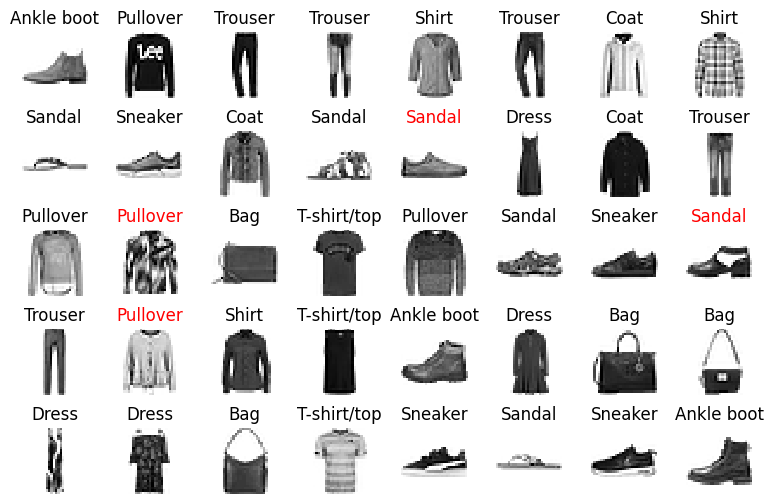

In [29]:
plotFashionToGrid(X_new, y_pred, fashion_names, nrows=nrows, ncols=ncols, startFrom=startFrom, yActual=y_new)

##### Confusion matrices

In [30]:
y_train_hat = model.predict(X_train)
y_valid_hat = model.predict(X_valid)
y_test_hat = model.predict(X_test)

313/313 [==============================] - 0s 1ms/step


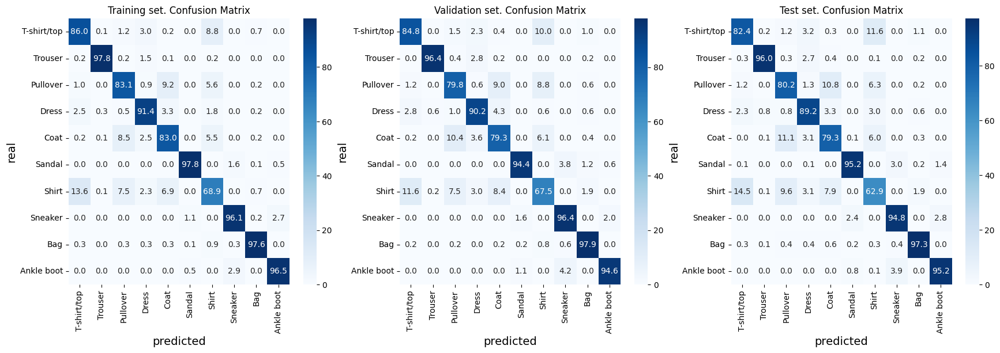

                     Accuracy      MAE         MSE
   Training set.      0.90        0.34        1.43
 Validation set.      0.88        0.37        1.52
       Test set.      0.87        0.42        1.75


In [31]:
plotConfusionMatrix(y_train, y_train_hat, y_valid, y_valid_hat, y_test, y_test_hat, fashion_names)

### Supervised learning of the fashion MNIST database, with a 2D CNN


#### Reshaping of the data

<div class="rqT" title="Reshape?">

Reshaping means changing the shape of an array.

The shape of an array is the number of elements in each dimension. Wanna try it? <a href="./AdvancedPython.ipynb#reshape">Load the "AdvancedPython.ipynb" notebook</a>

</div>
<br>
<div class="introT" title="Why reshaping?">

Because of the [input of `keras.conv2D`](https://keras.io/api/layers/convolution_layers/convolution2d/)

- **Input** = 4D tensor with shape: `(batch_size, image_size1, image_size2, channels)`
    - `batch_size` = number of samples of the dataset
    - `image_size1, image_size2` = dimension of the image, in pixels
    - `channels` = 1 for a b&w image, 3 for and rgb image
- **Output** = 4D tensor

</div>

In [32]:
X_trainR = reshapeForConv2D(X_train)
X_testR = reshapeForConv2D(X_test)
X_validR = reshapeForConv2D(X_valid)

Shape before = (55000, 28, 28)
 Shape after = (55000, 28, 28, 1)
Shape before = (10000, 28, 28)
 Shape after = (10000, 28, 28, 1)
Shape before = (5000, 28, 28)
 Shape after = (5000, 28, 28, 1)


#### Creation, compilation and training of the CNN model

<div class="introT" title="A word about the input of conv2D">


The `filters` parameters is just how many different windows you will have. (All of them with the same length, which is `kernel_size`). How many different results or channels you want to produce.

When you use `filters = 100` and `kernel_size=4`, you are creating 100 different filters, each of them with length 4. The result will bring 100 different convolutions
</div>

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 8)         80        
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 8)         0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 13, 13, 8)         0         
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 16)        1168      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 5, 5, 16)          0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 5, 5, 16)          0

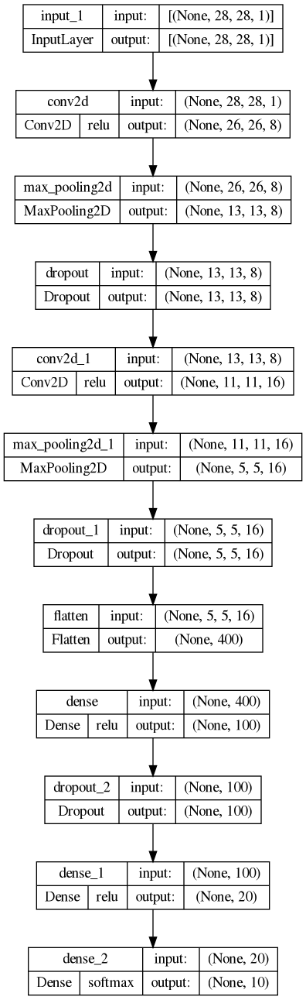

In [33]:
tf.keras.backend.clear_session()

modelCNN = tf.keras.Sequential()
modelCNN.add(tf.keras.layers.InputLayer(input_shape=[28, 28, 1]))

modelCNN.add(tf.keras.layers.Conv2D(8, kernel_size=(3,3),  activation='relu') )
modelCNN.add(tf.keras.layers.MaxPooling2D((2,2)))
modelCNN.add(tf.keras.layers.Dropout(0.3))

modelCNN.add(tf.keras.layers.Conv2D(16, (3,3), activation='relu') )
modelCNN.add(tf.keras.layers.MaxPooling2D((2,2)))
modelCNN.add(tf.keras.layers.Dropout(0.2))

modelCNN.add(tf.keras.layers.Flatten())
modelCNN.add(tf.keras.layers.Dense(100, activation="relu"))
modelCNN.add(tf.keras.layers.Dropout(0.3))
modelCNN.add(tf.keras.layers.Dense(20, activation="relu"))
modelCNN.add(tf.keras.layers.Dense(nclass, activation="softmax"))

t4pPC.centerTitle("Summary of the model")
modelCNN.summary()

t4pPC.centerTitle("Layers")
modelCNN.layers

t4pPC.centerTitle("Plot model")
from tensorflow.keras.utils import plot_model
plot_model(modelCNN, show_shapes=True, show_layer_names=True, show_layer_activations=True)

In [34]:
from tensorflow.keras.optimizers import SGD
optimizer = SGD(learning_rate=0.1)

modelCNN.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
rlr = ReduceLROnPlateau(monitor='val_loss',factor=0.5,patience=2,min_lr=1.e-6,verbose=1,min_delta=0.2)

vID.chrono_start()
historyCNN = modelCNN.fit(X_trainR, y_train,
                    epochs = 30,
                    validation_data=(X_validR, y_valid),
                    verbose = 1,
                    callbacks=[es,rlr],
                   )
vID.chrono_show()

Epoch 1/30
1719/1719 [==============================] - 7s 4ms/step - loss: 0.8074 - accuracy: 0.6916 - val_loss: 0.5202 - val_accuracy: 0.7946 - lr: 0.1000
Epoch 2/30
1719/1719 [==============================] - 6s 4ms/step - loss: 0.5613 - accuracy: 0.7892 - val_loss: 0.4320 - val_accuracy: 0.8448 - lr: 0.1000
Epoch 3/30
1714/1719 [============================>.] - ETA: 0s - loss: 0.5052 - accuracy: 0.8116
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.05000000074505806.
1719/1719 [==============================] - 6s 4ms/step - loss: 0.5050 - accuracy: 0.8117 - val_loss: 0.4131 - val_accuracy: 0.8390 - lr: 0.1000
Epoch 4/30
1719/1719 [==============================] - 6s 4ms/step - loss: 0.4508 - accuracy: 0.8300 - val_loss: 0.3782 - val_accuracy: 0.8606 - lr: 0.0500
Epoch 5/30
1708/1719 [============================>.] - ETA: 0s - loss: 0.4341 - accuracy: 0.8375
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.02500000037252903.
1719/1719 [============================

In [35]:
t4pPC.centerTitle("history.params")
historyCNN.params
t4pPC.centerTitle("history.history")
import pandas as pd
historyCNNDf = pd.DataFrame(historyCNN.history)
display(historyCNNDf)

{'verbose': 1, 'epochs': 30, 'steps': 1719}

,loss,accuracy,val_loss,val_accuracy,lr
0,0.807437,0.691600,0.520188,0.7946,0.100000
1,0.561269,0.789164,0.432042,0.8448,0.100000
2,0.504968,0.811691,0.413111,0.8390,0.100000
3,0.450831,0.829964,0.378223,0.8606,0.050000
4,0.433535,0.837800,0.388125,0.8508,0.050000
5,0.412330,0.846473,0.357967,0.8664,0.025000
6,0.404467,0.851000,0.340365,0.8752,0.025000
7,0.393491,0.852964,0.335576,0.8770,0.012500
8,0.388393,0.856345,0.334337,0.8746,0.012500
9,0.383882,0.857982,0.332144,0.8792,0.006250


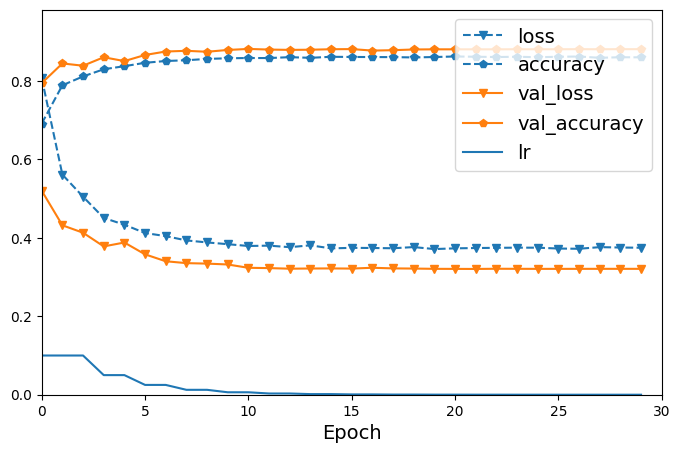

In [36]:
plot_metrics(historyCNNDf)

#### Evaluation of the accuracy

In [37]:
t4pPC.centerTitle("training set")
modelCNN.evaluate(X_trainR, y_train)
t4pPC.centerTitle("validation set")
modelCNN.evaluate(X_validR, y_valid)
t4pPC.centerTitle("test set")
modelCNN.evaluate(X_testR, y_test)

1719/1719 [==============================] - 3s 2ms/step - loss: 0.3006 - accuracy: 0.8876


[0.3005671203136444, 0.8876181840896606]

157/157 [==============================] - 0s 2ms/step - loss: 0.3210 - accuracy: 0.8812


[0.3210144340991974, 0.8812000155448914]

313/313 [==============================] - 1s 2ms/step - loss: 0.3328 - accuracy: 0.8752


[0.33276137709617615, 0.8751999735832214]

#### Prediction and comparison with the actual class

In [38]:
y_train_hat = modelCNN.predict(X_trainR)
y_valid_hat = modelCNN.predict(X_validR)
y_test_hat = modelCNN.predict(X_testR)

313/313 [==============================] - 1s 2ms/step


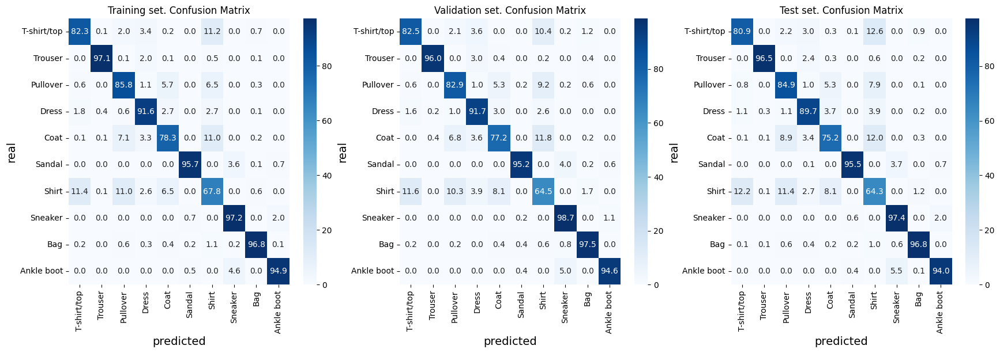

                     Accuracy      MAE         MSE
   Training set.      0.89        0.37        1.55
 Validation set.      0.88        0.38        1.59
       Test set.      0.88        0.41        1.70


In [39]:
plotConfusionMatrix(y_train, y_train_hat, y_valid, y_valid_hat, y_test, y_test_hat, fashion_names)

### Same as the previous model, but with filtered images

#### Filtering of the images

##### Plot an image sample, before filtering

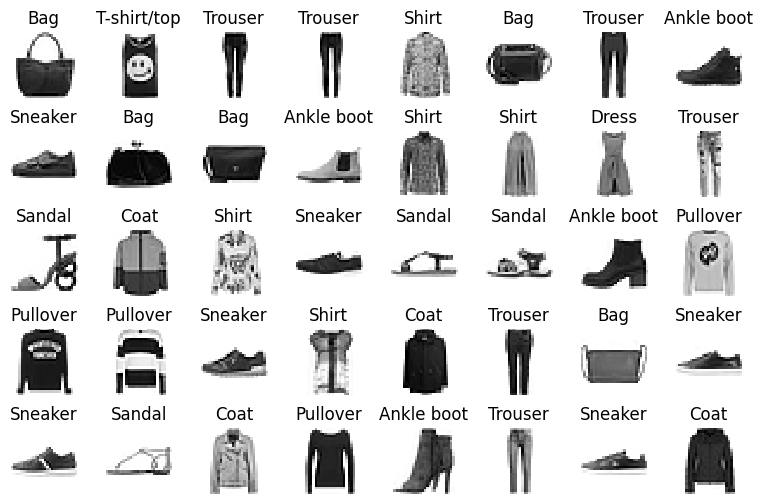

In [40]:
plotFashionToGrid(X_train_full, y_train_full, fashion_names, nrows=5, ncols=8, startFrom=100)

##### Plot again the same sample, after application of the Sobel filter

(60000, 28, 28)

(60000, 28, 28)

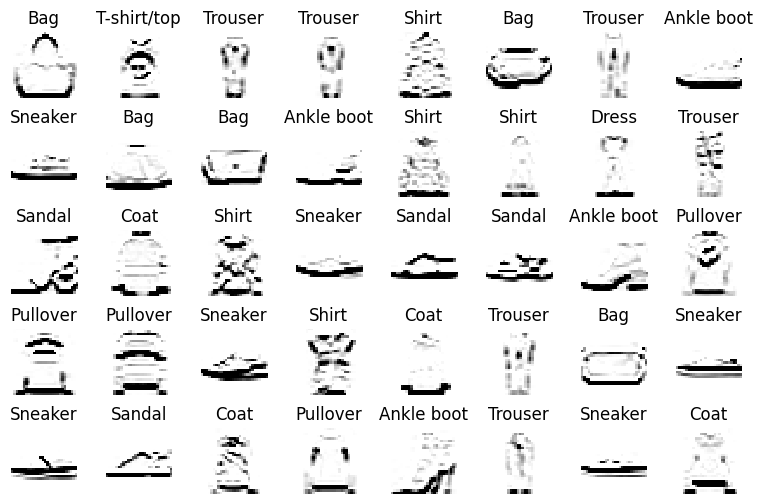

(10000, 28, 28)

(10000, 28, 28)

In [41]:
X_train_fullF=SobelBW(X_train_full)
X_train_full.shape
X_train_fullF.shape
plotFashionToGrid(X_train_fullF, y_train_full, fashion_names, nrows=5, ncols=8, startFrom=100)
X_testF=SobelBW(X_test)
X_test.shape
X_testF.shape

#### Make the training, validation and test sets, and reshape the data to adapt them to `keras.conv2D`

In [42]:
X_trainF, y_train = X_train_fullF[:-5000], y_train_full[:-5000]
X_validF, y_valid = X_train_fullF[-5000:], y_train_full[-5000:]
t4pPC.centerTitle("Training set")
X_trainF.shape
y_train.shape
t4pPC.centerTitle("Validation set")
X_validF.shape
y_valid.shape
t4pPC.centerTitle("Test set")
X_testF.shape
y_test.shape

(55000, 28, 28)

(55000,)

(5000, 28, 28)

(5000,)

(10000, 28, 28)

(10000,)

In [43]:
X_trainFR = reshapeForConv2D(X_trainF)
X_testFR = reshapeForConv2D(X_testF)
X_validFR = reshapeForConv2D(X_validF)

Shape before = (55000, 28, 28)
 Shape after = (55000, 28, 28, 1)
Shape before = (10000, 28, 28)
 Shape after = (10000, 28, 28, 1)
Shape before = (5000, 28, 28)
 Shape after = (5000, 28, 28, 1)


#### Definition of the model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 8)         80        
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 8)         0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 13, 13, 8)         0         
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 16)        1168      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 5, 5, 16)          0         
 g2D)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 5, 5, 16)          0

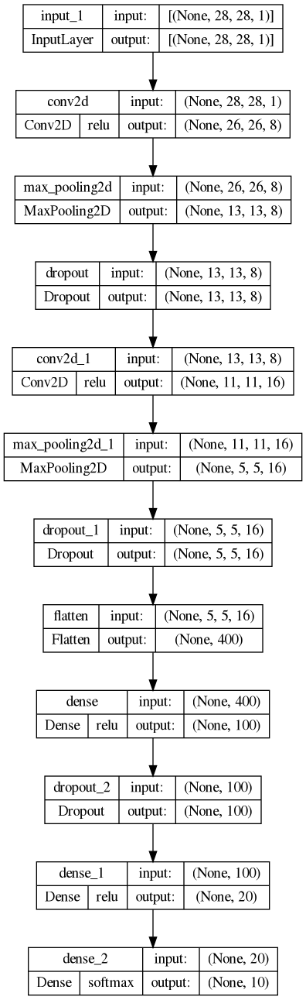

In [44]:
from tensorflow.keras.models import clone_model
modelCNNF = clone_model(modelCNN)

t4pPC.centerTitle("Summary of the model")
modelCNNF.summary()

t4pPC.centerTitle("Layers")
modelCNNF.layers

t4pPC.centerTitle("Plot model")
from tensorflow.keras.utils import plot_model
plot_model(modelCNNF, show_shapes=True, show_layer_names=True, show_layer_activations=True)

#### Training of the CNN model

In [45]:
from tensorflow.keras.optimizers import SGD
optimizer = SGD(learning_rate=0.1)

modelCNNF.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
rlr = ReduceLROnPlateau(monitor='val_loss',factor=0.5,patience=2,min_lr=1.e-6,verbose=1,min_delta=0.2)

vID.chrono_start()
historyCNNF = modelCNNF.fit(X_trainFR, y_train,
                    epochs = 30,
                    validation_data=(X_validFR, y_valid),
                    verbose = 1,
                    callbacks=[es,rlr],
                   )
vID.chrono_show()

Epoch 1/30
1719/1719 [==============================] - 7s 4ms/step - loss: 0.7625 - accuracy: 0.7245 - val_loss: 0.4702 - val_accuracy: 0.8340 - lr: 0.1000
Epoch 2/30
1719/1719 [==============================] - 6s 4ms/step - loss: 0.5407 - accuracy: 0.8028 - val_loss: 0.3886 - val_accuracy: 0.8548 - lr: 0.1000
Epoch 3/30
1706/1719 [============================>.] - ETA: 0s - loss: 0.4972 - accuracy: 0.8188
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.05000000074505806.
1719/1719 [==============================] - 6s 4ms/step - loss: 0.4970 - accuracy: 0.8188 - val_loss: 0.3708 - val_accuracy: 0.8604 - lr: 0.1000
Epoch 4/30
1719/1719 [==============================] - 7s 4ms/step - loss: 0.4447 - accuracy: 0.8351 - val_loss: 0.3572 - val_accuracy: 0.8624 - lr: 0.0500
Epoch 5/30
1718/1719 [============================>.] - ETA: 0s - loss: 0.4308 - accuracy: 0.8403
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.02500000037252903.
1719/1719 [============================

{'verbose': 1, 'epochs': 30, 'steps': 1719}

,loss,accuracy,val_loss,val_accuracy,lr
0,0.762507,0.724527,0.470214,0.8340,0.100000
1,0.540666,0.802818,0.388645,0.8548,0.100000
2,0.496957,0.818782,0.370839,0.8604,0.100000
3,0.444677,0.835091,0.357244,0.8624,0.050000
4,0.430845,0.840273,0.347017,0.8644,0.050000
5,0.413523,0.848327,0.330549,0.8746,0.025000
6,0.401396,0.850909,0.321942,0.8766,0.025000
7,0.395875,0.853909,0.315698,0.8792,0.012500
8,0.390036,0.856309,0.313230,0.8794,0.012500
9,0.389359,0.856655,0.314255,0.8802,0.006250


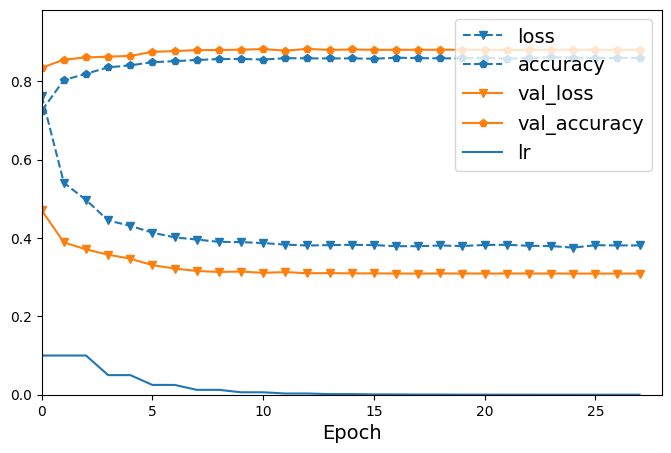

In [46]:
t4pPC.centerTitle("history.params")
historyCNNF.params
t4pPC.centerTitle("history.history")
import pandas as pd
historyCNNFDf = pd.DataFrame(historyCNNF.history)
display(historyCNNFDf)

plot_metrics(historyCNNFDf)

#### Evaluation of the accuracy

In [47]:
t4pPC.centerTitle("training set")
modelCNNF.evaluate(X_trainFR, y_train)
t4pPC.centerTitle("validation set")
modelCNNF.evaluate(X_validFR, y_valid)
t4pPC.centerTitle("test set")
modelCNNF.evaluate(X_testFR, y_test)

1719/1719 [==============================] - 3s 2ms/step - loss: 0.2954 - accuracy: 0.8899


[0.295385479927063, 0.8898727297782898]

157/157 [==============================] - 0s 2ms/step - loss: 0.3091 - accuracy: 0.8794


[0.3090553879737854, 0.8794000148773193]

313/313 [==============================] - 1s 2ms/step - loss: 0.3393 - accuracy: 0.8746


[0.3392650783061981, 0.8745999932289124]

#### Prediction and comparison with the actual class

In [48]:
y_train_hat = modelCNNF.predict(X_trainFR)
y_valid_hat = modelCNNF.predict(X_validFR)
y_test_hat = modelCNNF.predict(X_testFR)

313/313 [==============================] - 1s 2ms/step


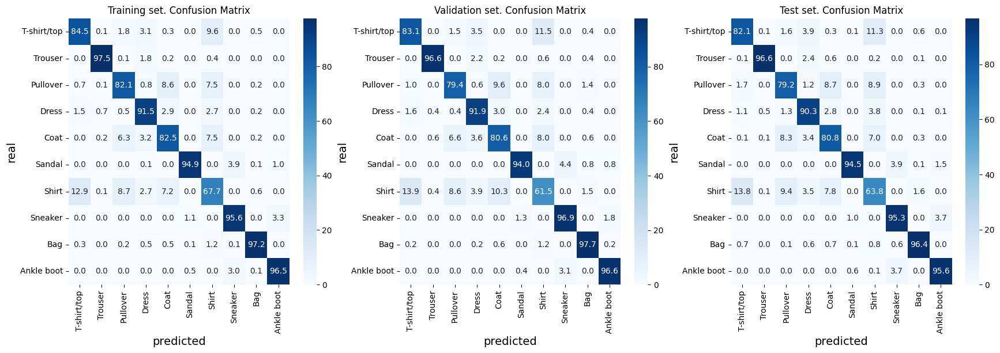

                     Accuracy      MAE         MSE
   Training set.      0.89        0.36        1.50
 Validation set.      0.88        0.40        1.67
       Test set.      0.87        0.41        1.73


In [49]:
plotConfusionMatrix(y_train, y_train_hat, y_valid, y_valid_hat, y_test, y_test_hat, fashion_names)

## Appendix: additional functions

### Salt and pepper

(1014, 1600)

Image = 1014 pixels x 1600 pixels = 1622400 pixels
Number of random black/white pixels = 16224
W: 1600 pixels x H: 1014 pixels = 1622400 pixels


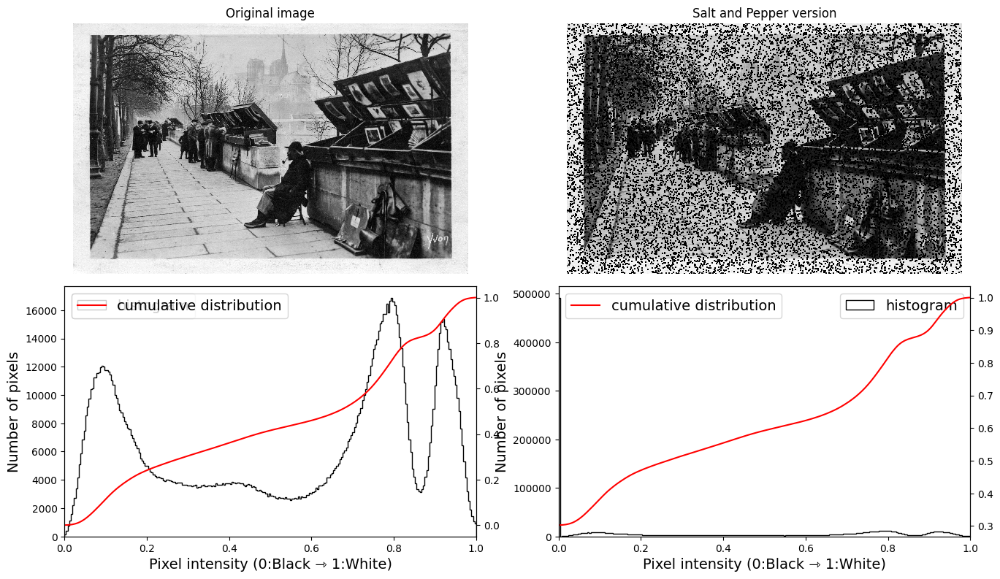

In [50]:
def add_SaltPepperNoise(img, ratio=10, CornSize = 3, SaltAndPepper="SaltAndPepper",show=True): 
    import random
    import matplotlib.pyplot as plt
    import numpy as np
    # Getting the dimensions of the image 
    row , col = img.shape 
    imgNew = img.copy()

    npix = row*col
    print(f"Image = {row} pixels x {col} pixels = {npix} pixels")
    number_of_pixels = npix*ratio//100 
    print(f"Number of random black/white pixels = {number_of_pixels}")
    shift = CornSize//2
    if SaltAndPepper == 'SaltAndPepper' or SaltAndPepper == 'Salt':
        # Randomly pick some pixels in the image for coloring them white
        for i in range(number_of_pixels): 
            yrow=random.randint(0, row - 1) 
            xcol=random.randint(0, col - 1)
            for y in range(yrow-shift,yrow+shift):
                for x in range(xcol-shift,xcol+shift):
                    yR = max(min(y,0),min(y,row-1))
                    xR = max(min(x,0),min(x,col-1))
                    imgNew[yR][xR] = 1.
    if SaltAndPepper == 'SaltAndPepper' or SaltAndPepper == 'Pepper':
        # Randomly pick some pixels in the image for coloring them black 
        for i in range(number_of_pixels): 
            yrow=random.randint(0, row - 1) 
            xcol=random.randint(0, col - 1) 
            for y in range(yrow-shift,yrow+shift):
                for x in range(xcol-shift,xcol+shift):
                    yR = max(min(y,0),min(y,row-1))
                    xR = max(min(x,0),min(x,col-1))
                    imgNew[yR][xR] = 0.
    if show:
        plotimgs_SideBySide([img,imgNew], imgW=8, titles=["Original image", "Salt and Pepper version"], histogram=True)
    return imgNew

from matplotlib import pyplot as plt
from skimage.color import rgb2gray
img = plt.imread('./ML-Figures/bouquinistes/bouquinistes.jpg')
img = rgb2gray(img)
img.shape
imgPepper = add_SaltPepperNoise(img, 1, 7, SaltAndPepper="Pepper")
plt.imsave('./ML-Figures/bouquinistes/bouquinistesPepper.jpg', imgPepper, cmap="gray")

### Sobel filter

<div class="intro">
    
The Sobel operator, sometimes called the Sobel–Feldman operator or Sobel filter, is used in image processing and computer vision, particularly within edge detection algorithms where it creates an image emphasising edges
</div>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from skimage.color import rgb2gray
    
Sobel = np.array([-1, -2, -1,0,0,0,1,2,1])
Sobel=Sobel.reshape(3,3)
print(Sobel)

imgT = plt.imread('./ML-Figures/bouquinistes/bouquinistesTorned.jpg')
# imgT = plt.imread('./ML-Figures/bouquinistes/bouquinistesPepper.jpg')
imgTGray = rgb2gray(imgT)
contourT = convolve(imgTGray,Sobel,mode='reflect')
plotimgs_SideBySide([imgTGray, contourT],imgW=10,titles=["original image","Sobel filtering"])

imgTWM =  plt.imread('./ML-Figures/bouquinistes/bouquinistesTornedWithMask.jpg')
# imgTWM =  plt.imread('./ML-Figures/bouquinistes/bouquinistesPepper.jpg')
imgTWMGray = rgb2gray(imgTWM)
contourTWM = convolve(imgTWMGray,Sobel,mode='reflect')
plotimgs_SideBySide([imgTWMGray, contourTWM],imgW=10,titles=["original image with black mask","Sobel filtering"])


## Development part

In [ ]:
import numpy as np

# global variables for the Diag example
mask0 = 40
mask1 = 45

np.set_printoptions(precision=3, linewidth=2000, edgeitems=20)

def SimpleExamples(Example="Diag", Kernel="k1", Ksize=3):
    import matplotlib.pyplot as plt

    def normalized_convolution_inpaint(image, maskBool, Kernel='k1',Ksize=10):
        from scipy.ndimage import convolve as cv
        t4pPC.centerTitle(f"Inside normalized convolution.   Kernel = {Kernel}")
        H, W = image.shape
        print(f"The normalized convolution algorithm will be applied to a W:{W} pixels x H:{H} pixels image")
        HBM, WBM = maskBool.shape
        print(f"                               Size of the boolean mask = W:{WBM} pixels x H:{HBM} pixels image")
        if Kernel == 'k1':
            kernel = np.array([[0, 1, 0],
                               [1, 0, 1],
                               [0, 1, 0]])
        elif Kernel == 'gaussian':
            kernel = np.array([[1, 4, 7, 4, 1],
                               [4, 16, 26, 16, 4],
                               [7, 26, 41, 26, 7],
                               [4, 16, 26, 16, 4],
                               [1, 4, 7, 4, 1]])
        elif Kernel == 'average':
            kernel=kernel2D(Ksize)
    
        # Apply the convolution to inpaint the missing regions
        smoothed_image = cv(image, kernel, mode='nearest')
        t4pPC.centerTitle("Smoothed image")
        print(smoothed_image)
        normalization_factor = cv(mask+1e-10, kernel, mode='nearest') # 1e-10 avoids division by zero
        t4pPC.centerTitle("Normalization factor")
        print(normalization_factor)
        inpainted_patch = smoothed_image / normalization_factor
        t4pPC.centerTitle("inpainted_patch")
        print(inpainted_patch)

        def NormalizeData(data):
            return (data - np.min(data)) / (np.max(data) - np.min(data))
            
        inpainted_patch = NormalizeData(inpainted_patch)  # rescale values to [0, 1]
    
        inpainted_image = image.copy()
        
        inpainted_image[maskBool] = inpainted_patch[maskBool]
    
        # print("masked zone of the inpainted image, i.e. should be the copy of ftilde")
        # print(imageTmp[maskBool])
        return smoothed_image, normalization_factor, inpainted_patch, inpainted_image
    
    # Example usage
    
    if Example == "Diag":
        # Create a sample image
        image = np.random.rand(100, 100)/2
        for b in range(-100,100,10):
            for w in range(100):
                h0 = w + b
                h1 = w + b + 1
                h2 = w + b + 2
                if h0 in range(0,100):
                    image[h0,w]=1.
                if h1 in range(0,100):
                    image[h1,w]=1.
                if h2 in range(0,100):
                    image[h2,w]=1.
        
        # Now create a copy of the previous image and add a missing region
        mask = np.ones_like(image)
        
        mask[mask0:mask1, mask0:mask1] = 0
        imageWithMask = image.copy()
        imageWithMask[mask0:mask1, mask0:mask1] = 0
        Ksize = 5
    
    if Example == "Lena":
        image = plt.imread('./ML-Figures/Lena/Lena.jpg')
        image = rgb2gray(image)
        imageWithMask = plt.imread('./ML-Figures/Lena/LenaWithCross.jpg')
        imageWithMask = rgb2gray(imageWithMask)
        mask = plt.imread('./ML-Figures/Lena/LenaCrossMask.jpg')
        mask = rgb2gray(mask)
        Ksize = 5

    if Example == "Booksellers":
        image = plt.imread('./ML-Figures/bouquinistes/bouquinistes.jpg')
        image = rgb2gray(image)
        imageWithMask = plt.imread('./ML-Figures/bouquinistes/bouquinistesTornedWithMask.jpg')
        imageWithMask = rgb2gray(imageWithMask)
        mask = plt.imread('./ML-Figures/bouquinistes/bouquinistesTorned-MaskOnly.jpg')
        mask = rgb2gray(mask)
        Ksize = 5

    if Example == "Soldier":
        image = plt.imread('./ML-Figures/Soldier/OldPicture.jpg')
        image = rgb2gray(image)
        imageWithMask = plt.imread('./ML-Figures/Soldier/OldPicture_WithMask.jpg')
        imageWithMask = rgb2gray(imageWithMask)
        mask = plt.imread('./ML-Figures/Soldier/OldPicture_Mask.jpg')
        mask = rgb2gray(mask)
        Ksize = 5

    maskBool = (mask<=1e-5) # true if black
    
    ###################################################################################
    # Inpaint the missing region
    smoothed_image, normalization_factor, inpainted_patch, inpainted_image = normalized_convolution_inpaint(imageWithMask, maskBool, Kernel=Kernel, Ksize=Ksize)
    ###################################################################################
    
    t4pPC.centerTitle("Plots")
    
    # Display the results
    plt.figure(figsize=(20, 10))
    
    _ = plt.subplot(1, 4, 1)
    _ = plt.title('Original image with masked zone')
    _ = plt.imshow(imageWithMask, cmap='gray')
    _ = plt.axis('off')
    
    _ = plt.subplot(1, 4, 2)
    _ = plt.title('Boolean mask')
    _ = plt.imshow(np.invert(maskBool), cmap='gray')
    _ = plt.axis('off')
    
    _ = plt.subplot(1, 4, 3)
    _ = plt.title('Smoothed image')
    _ = plt.imshow(smoothed_image, cmap='gray')
    _ = plt.axis('off')

    _ = plt.subplot(1, 4, 4)
    _ = plt.title('Normalization factor')
    _ = plt.imshow(normalization_factor, cmap='gray')
    _ = plt.axis('off')

    plt.show()
    
    plt.figure(figsize=(20, 20))
    _ = plt.subplot(1,2,1)
    _ = plt.title('Inpainted image patch')
    _ = plt.imshow(inpainted_patch, cmap='gray')
    _ = plt.axis('off')
    _ = plt.axis('off')
    _ = plt.subplot(1,2,2)
    _ = plt.title('Inpainted image')
    _ = plt.imshow(inpainted_image, cmap='gray')
    _ = plt.axis('off')
    _ = plt.axis('off')
    plt.show()
    return

Kernel = "average"
for Example in ["Diag","Lena","Booksellers","Soldier"]:
    t4pPC.centertxt(f"Case: {Example}. Kernel = {Kernel}", size=16, weight='bold', bgc="red", fgc="white")
    SimpleExamples(Example, Kernel=Kernel)

# Useful links

[Convolution article on Wikipedia](https://en.wikipedia.org/wiki/Convolution)

[Hands-on machine learning with scikit-learn, keras and tensorflow (3rd edition, **2022**), Aurélien Géron, O'Reilly editions](https://github.com/ageron/handson-ml3)

Some images were generated with [DALL·E](https://openai.com/dall-e-2)

In [ ]:
vID.end(cwd0)